# Um quadrado giratório.

Rotacionando e contraindo um quadrado com o centro fixo, podemos obter esta imagem bastante bonita e instigante, pela ilusão de ótica que ela produz.

<img src="imagens/ilusao_otica.svg" alt="Drawing" style="width: 500px;"/>

A seguir, mostraremos uma maneira de criar essa imagem e de animá-la usando o módulo *matplotlib.pyplot*.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

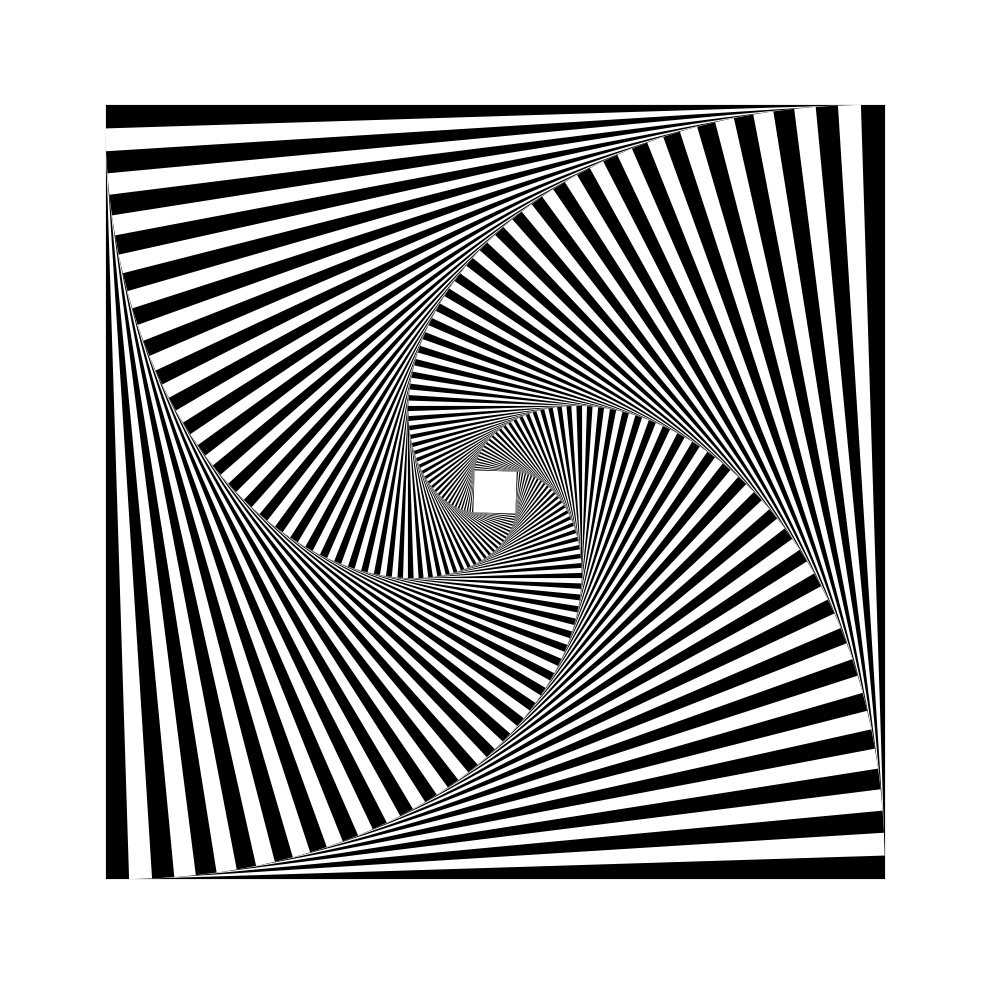

In [2]:
#Valores das constantes.
n = 100
factor = 1
angulo = 0
     
#Parâmetros da figura
figsize = (4, 4)
colunas = 1
linhas = 1
#Criar os objetos fig e ax
fig, ax = plt.subplots(linhas, colunas, figsize=figsize, dpi=300)

#Lista de cores preto e branco
cores = ['black', 'white'] 
  
#Plotar n quadrados
for i in range(n):
    #Plotar um quadrado rotacionado e contraído
    poly = plt.Rectangle((-factor,-factor), factor*2, factor*2, angle = angulo, 
                          rotation_point = 'center', color = cores[i % 2])
    ax.add_patch(poly)
    #Atualizar o fator de contração e o ângulo de rotação
    factor *= 1/(np.sin(np.pi/n) + np.cos(np.pi/n))
    angulo += 180/n #(np.pi/n)
        
#Mais configurações
#ax.axis('square')
ax.axis([-1.2,1.2,-1.2,1.2])
ax.axis('off')    
plt.show()
#fig.savefig('ilusao_otica1.svg', transparent=True)

In [3]:
# Animação do quadrado giratório

#Módulo para fazer animações
import matplotlib.animation as animation

#Configurações da notebook para mostrar a animação
%matplotlib inline
plt.rcParams["animation.html"] = "jshtml"

#Lista de n fatores de contração.
n = 80
factor = [1/(np.sin(np.pi/n) + np.cos(np.pi/n))**i for i in range(n)]

#Lista de cores preto e branco
cores = ['black', 'white'] 

#Parâmetros da figura
figsize = (6, 6)
colunas = 1
linhas = 1

#Criar os objetos fig e ax
fig, ax = plt.subplots(linhas, colunas, figsize=figsize, layout="constrained", dpi=100)

# Limites em x e y

ax.axis([-1.2,1.2,-1.2,1.2])

# Esconder os eixos e o fundo

fig.patch.set_visible(False)
ax.axis('off')

#Inicializar patches
patches = []
    
#Função que inicializa a animação
def init():
    poly = plt.Rectangle((-1,-1), 2, 2, angle = 0, rotation_point = 'center', 
                         color = cores[i % 2])
    patches.append(ax.add_patch(poly))
    return patches,

#Função que atualiza o quadrado
def update(passo):
    poly = plt.Rectangle((-factor[passo],-factor[passo]), factor[passo]*2, factor[passo]*2,
                         angle = passo * 180/n, rotation_point = 'center', 
                         color = cores[passo % 2])
    patches.append(ax.add_patch(poly))
    return patches,

#ani é uma instância da classe FuncAnimation
ani = animation.FuncAnimation(fig, update, init_func=init, frames = n,
                    blit=False, interval = 100)

#Não queremos mostrar a figura
plt.close()
#Mostrar a animação
ani
#ani.save("ani_teste.mp4", writer="ffmpeg")    